### Adding Dependencies

In [20]:
import numpy as np
import pandas as pd
#from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np
from sys import argv
from sklearn.metrics import f1_score,confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC, LinearSVC
from sklearn import metrics
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.preprocessing import Imputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score
from sklearn.dummy import DummyClassifier
from sklearn.metrics import confusion_matrix
from sklearn import svm, grid_search
from sklearn.feature_selection import RFE
from pandas.plotting import scatter_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import learning_curve
from sklearn.model_selection import KFold 
from sklearn.model_selection import RepeatedKFold
from xgboost import XGBClassifier

### Reading the data

In [21]:
df = pd.read_csv('MHealth.csv', index_col=0)
df.head()

,1,2,3,4,5,6,7,8,9,10,...,15,16,17,18,19,20,21,22,23,24
0,-9.8646,0.298600,1.6900,-0.25955,-0.146520,0.49965,-9.6680,1.5216,-0.47866,-0.53471,...,-4.6451,-8.2508,1.9208,-0.98039,-0.41889,0.18966,0.72891,1.07810,-0.357210,0
1,-9.7753,0.381060,1.6132,-0.12977,-0.058608,0.40572,-9.5801,1.4001,-0.48423,-0.54409,...,-4.7847,-8.2609,1.9099,-0.98039,-0.41889,0.18966,0.18670,0.71683,-0.725460,0
2,-9.6195,0.169430,1.7205,-0.10466,-0.037677,0.42741,-9.6488,1.4593,-0.48423,-0.54409,...,-4.4974,-8.3198,2.0215,-0.97647,-0.42094,0.20043,0.18855,0.90189,-0.366260,0
3,-9.7610,0.169380,1.5837,-0.11722,-0.037677,0.32193,-9.4522,1.3119,-0.48423,-0.54409,...,-4.6902,-8.4318,1.8180,-0.97647,-0.42094,0.20043,0.18677,0.72405,-0.003505,0
4,-9.8078,-0.013582,1.6514,-0.13815,-0.054422,0.46731,-9.6397,1.3769,-0.49165,-0.52345,...,-4.7595,-8.4420,1.7966,-0.97647,-0.42094,0.20043,0.74339,2.52610,-0.732410,0


In [22]:
df.shape

(130561, 24)

### Preprocessing the data

In [23]:
df.rename(columns = {'24':'Class'}, inplace = True) 

In [24]:
df.columns

Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13',
       '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', 'Class'],
      dtype='object')

In [25]:
df=df.convert_objects(convert_numeric = True)

C:\Users\Viral\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  """Entry point for launching an IPython kernel.


In [26]:
df.dtypes

1        float64
2        float64
3        float64
4        float64
5        float64
6        float64
7        float64
8        float64
9        float64
10       float64
11       float64
12       float64
13       float64
14       float64
15       float64
16       float64
17       float64
18       float64
19       float64
20       float64
21       float64
22       float64
23       float64
Class      int64
dtype: object

In [27]:
df_features = df.drop(df.columns[[23]], axis=1)

In [28]:
df_features.head()

,1,2,3,4,5,6,7,8,9,10,...,14,15,16,17,18,19,20,21,22,23
0,-9.8646,0.298600,1.6900,-0.25955,-0.146520,0.49965,-9.6680,1.5216,-0.47866,-0.53471,...,-0.29244,-4.6451,-8.2508,1.9208,-0.98039,-0.41889,0.18966,0.72891,1.07810,-0.357210
1,-9.7753,0.381060,1.6132,-0.12977,-0.058608,0.40572,-9.5801,1.4001,-0.48423,-0.54409,...,-0.43507,-4.7847,-8.2609,1.9099,-0.98039,-0.41889,0.18966,0.18670,0.71683,-0.725460
2,-9.6195,0.169430,1.7205,-0.10466,-0.037677,0.42741,-9.6488,1.4593,-0.48423,-0.54409,...,-0.15525,-4.4974,-8.3198,2.0215,-0.97647,-0.42094,0.20043,0.18855,0.90189,-0.366260
3,-9.7610,0.169380,1.5837,-0.11722,-0.037677,0.32193,-9.4522,1.3119,-0.48423,-0.54409,...,-0.29061,-4.6902,-8.4318,1.8180,-0.97647,-0.42094,0.20043,0.18677,0.72405,-0.003505
4,-9.8078,-0.013582,1.6514,-0.13815,-0.054422,0.46731,-9.6397,1.3769,-0.49165,-0.52345,...,-0.15708,-4.7595,-8.4420,1.7966,-0.97647,-0.42094,0.20043,0.74339,2.52610,-0.732410


In [29]:
df_features.shape

(130561, 23)

# Visualizing the correlation between the features 

Visualize correlation between some features: 



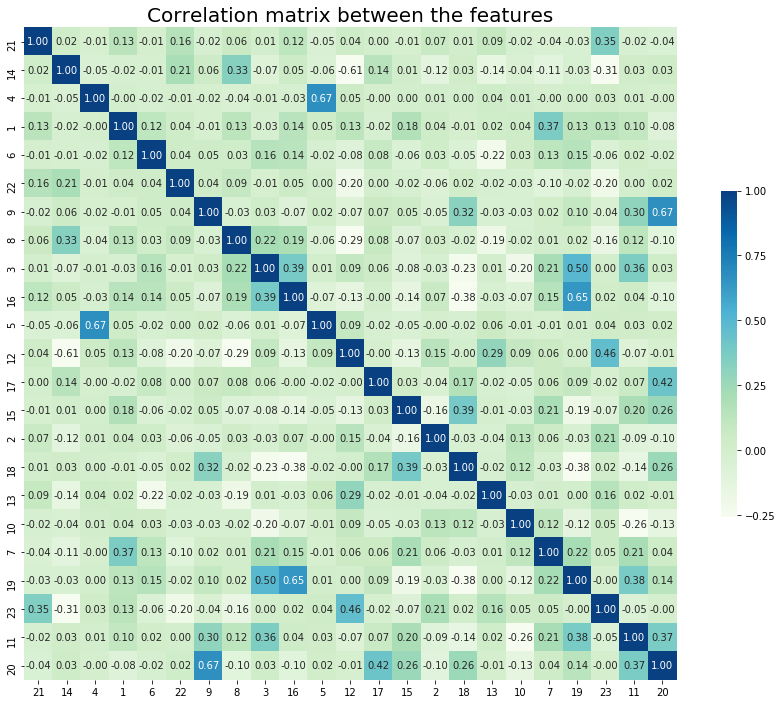

In [30]:
print('Visualize correlation between some features: ')
print()
correlation_matrix = df_features[df_features.columns.to_series().sample(23)].corr()
plt.figure(figsize=(16,12))
ax = sns.heatmap(correlation_matrix, vmax=1, square=True, annot=True,fmt='.2f', cmap ='GnBu', cbar_kws={"shrink": .5}, robust=True)
plt.title('Correlation matrix between the features', fontsize=20)
plt.show()
print()

### Very low correlation between features as per initial analysis.

### K FOLD Cross Validation 

In [31]:
df.columns = df.columns.to_series().apply(lambda x: x.strip())

# K FOLD Cross Validation 

In [32]:
def getTrainTest(data):
    print()
    print('Splitting the data further into train/test...')
    X = data[data.loc[:, data.columns != 'Class'].columns]
    Y = data['Class']
    X = data.iloc[:, 0:23].as_matrix()
    Y = data.iloc[:,23].as_matrix()
    kf = RepeatedKFold(n_splits=10, n_repeats=10, random_state=None) 
    for train_index, test_index in kf.split(X):
      #print("Train:", train_index, "Validation:",test_index)
      X_train, X_test = X[train_index], X[test_index] 
      y_train, y_test = Y[train_index], Y[test_index]
    return X, Y, X_train, X_test, y_train, y_test

X, Y, X_train, X_test, y_train, y_test = getTrainTest(df)


Splitting the data further into train/test...


C:\Users\Viral\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\Viral\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  import sys


# FEATURE SELECTION
Feature selections helps to determine which features aid the learning of the model. If many important features are given to the model to learn the model will learn well and give accurately predictions during testing or when it is deployed.

Using PCA - Principal Component Analysis for feature reduction and selection of features (with maximum variance)

In [35]:
# Trying PCA - Works the best for feature selection

def doFeatureSelection(X_train,X_test):
    print()
    print('Selecting features by using Principal Component Analysis...')
    scaler = StandardScaler()
    scaler.fit(X_train)
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    #here 0.88 is chosen after k fold cross validation.
    #It means that scikit-learn choose the minimum number of principal components such that 95% of the variance is retained.
    pca = PCA(0.88)
    pca.fit(X_train)
    X_train_transformed = pca.transform(X_train_scaled)
    X_test_transformed = pca.transform(X_test_scaled)
    return X_train_transformed, X_test_transformed

X_train_selected, X_test_selected = doFeatureSelection(X_train,X_test)


Selecting features by using Principal Component Analysis...


# Confusion Matrix 

In [36]:
def plotConfusionMatrix(cnf_matrix, classifier_name):
    print('Plotting the confusion matrix to observe which data points are incorrectly classified')
    print()
    plt.figure(figsize=(16,9))
    ax= plt.subplot()
    sns.heatmap(cnf_matrix, annot=True, ax = ax);
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix for {}'.format(classifier_name)); 
    ax.xaxis.set_ticklabels(['1', '2', '3', '4', '5','6','7','8','9','10']); ax.yaxis.set_ticklabels(['1', '2', '3', '4', '5','6','7','8','9','10']);
    plt.show()

# TRAINING AND TESTING VARIOUS CLASSIFIERS
Different classifiers give different results (classification results), training and testing various classifier helps to determine which classifier performs the best.

In [37]:
df.head()

,1,2,3,4,5,6,7,8,9,10,...,15,16,17,18,19,20,21,22,23,Class
0,-9.8646,0.298600,1.6900,-0.25955,-0.146520,0.49965,-9.6680,1.5216,-0.47866,-0.53471,...,-4.6451,-8.2508,1.9208,-0.98039,-0.41889,0.18966,0.72891,1.07810,-0.357210,0
1,-9.7753,0.381060,1.6132,-0.12977,-0.058608,0.40572,-9.5801,1.4001,-0.48423,-0.54409,...,-4.7847,-8.2609,1.9099,-0.98039,-0.41889,0.18966,0.18670,0.71683,-0.725460,0
2,-9.6195,0.169430,1.7205,-0.10466,-0.037677,0.42741,-9.6488,1.4593,-0.48423,-0.54409,...,-4.4974,-8.3198,2.0215,-0.97647,-0.42094,0.20043,0.18855,0.90189,-0.366260,0
3,-9.7610,0.169380,1.5837,-0.11722,-0.037677,0.32193,-9.4522,1.3119,-0.48423,-0.54409,...,-4.6902,-8.4318,1.8180,-0.97647,-0.42094,0.20043,0.18677,0.72405,-0.003505,0
4,-9.8078,-0.013582,1.6514,-0.13815,-0.054422,0.46731,-9.6397,1.3769,-0.49165,-0.52345,...,-4.7595,-8.4420,1.7966,-0.97647,-0.42094,0.20043,0.74339,2.52610,-0.732410,0


# Let's check results with a default Decision Tree!

In [39]:
from sklearn import tree

In [40]:
clf = tree.DecisionTreeClassifier()

In [41]:
clf.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [42]:
clf.predict(X_test)

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [43]:
predicted = clf.predict(X_test)

In [44]:
predicted

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

# 1. Accuracy Score

In [45]:
accuracy_score(y_test, predicted)

0.9451593137254902

# 2. Precision and Recall Values

In [46]:
from sklearn.metrics import precision_score
precision_score(y_test, predicted, average='weighted')

0.944944894600608

In [47]:
from sklearn.metrics import recall_score
recall_score(y_test,predicted, average='macro')

0.9039679730145309

# 3. Classifcation Report

In [48]:
from sklearn.metrics import classification_report
target_names = ['class 1', 'Class 2', 'Class 3', 'Class 4', 'Class 5', 'Class 6', 'Class 7', 'Class 8', 'Class 9', 'class 10']
print(classification_report(y_test, predicted, target_names=target_names))

             precision    recall  f1-score   support

    class 1       0.96      0.97      0.96      9493
    Class 2       0.90      0.87      0.89      1071
    Class 3       0.83      0.81      0.82       300
    Class 4       0.86      0.87      0.86       313
    Class 5       0.91      0.90      0.90       318
    Class 6       0.88      0.90      0.89       310
    Class 7       0.96      0.95      0.95       310
    Class 8       0.92      0.94      0.93       315
    Class 9       0.95      0.94      0.95       340
   class 10       0.92      0.91      0.91       286

avg / total       0.94      0.95      0.95     13056



# 4. Confusion Matrix

Confusion Matrix
[[9161   98   48   43   28   37   12   27   15   24]
 [ 134  933    0    0    2    1    0    0    1    0]
 [  58    0  242    0    0    0    0    0    0    0]
 [  42    0    0  271    0    0    0    0    0    0]
 [  31    1    0    0  286    0    0    0    0    0]
 [  32    0    0    0    0  278    0    0    0    0]
 [  17    0    0    0    0    0  293    0    0    0]
 [  19    0    0    0    0    0    1  295    0    0]
 [  19    0    0    0    0    0    0    0  321    0]
 [  26    0    0    0    0    0    0    0    0  260]]

Plotting the confusion matrix to observe which data points are incorrectly classified



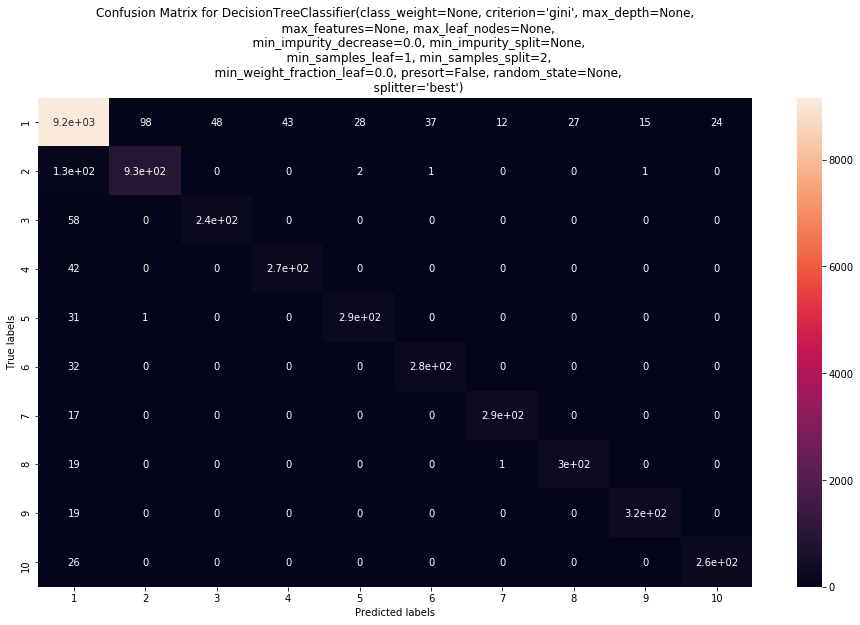

In [49]:
cnf_matrix = confusion_matrix(y_test, predicted)
print("Confusion Matrix")
print(cnf_matrix)
print()
plotConfusionMatrix(cnf_matrix,clf)

### confusion matrix usage to evaluate the quality of the output of a classifier on the MHealth data set. The diagonal elements represent the number of points for which the predicted label is equal to the true label, while off-diagonal elements are those that are mislabeled by the classifier. The higher the diagonal values of the confusion matrix the better, indicating many correct predictions.

# Plotting Decision Tree!

In [50]:
dot_data = tree.export_graphviz(clf, out_file='tree.dot') 

In [51]:
df_features.head()

,1,2,3,4,5,6,7,8,9,10,...,14,15,16,17,18,19,20,21,22,23
0,-9.8646,0.298600,1.6900,-0.25955,-0.146520,0.49965,-9.6680,1.5216,-0.47866,-0.53471,...,-0.29244,-4.6451,-8.2508,1.9208,-0.98039,-0.41889,0.18966,0.72891,1.07810,-0.357210
1,-9.7753,0.381060,1.6132,-0.12977,-0.058608,0.40572,-9.5801,1.4001,-0.48423,-0.54409,...,-0.43507,-4.7847,-8.2609,1.9099,-0.98039,-0.41889,0.18966,0.18670,0.71683,-0.725460
2,-9.6195,0.169430,1.7205,-0.10466,-0.037677,0.42741,-9.6488,1.4593,-0.48423,-0.54409,...,-0.15525,-4.4974,-8.3198,2.0215,-0.97647,-0.42094,0.20043,0.18855,0.90189,-0.366260
3,-9.7610,0.169380,1.5837,-0.11722,-0.037677,0.32193,-9.4522,1.3119,-0.48423,-0.54409,...,-0.29061,-4.6902,-8.4318,1.8180,-0.97647,-0.42094,0.20043,0.18677,0.72405,-0.003505
4,-9.8078,-0.013582,1.6514,-0.13815,-0.054422,0.46731,-9.6397,1.3769,-0.49165,-0.52345,...,-0.15708,-4.7595,-8.4420,1.7966,-0.97647,-0.42094,0.20043,0.74339,2.52610,-0.732410


In [52]:
feature_name = list(df_features)

In [53]:
# feature_name

In [54]:
target_name = ['1','2','3','4','5','6','7','8','9','10']

In [57]:
import graphviz

In [58]:
dot_data = tree.export_graphviz(clf, out_file=None, 
                         feature_names=feature_name,  
                         class_names=target_names,  
                         filled=True, rounded=True,  
                         special_characters=True)  
graph = graphviz.Source(dot_data)  
graph 

By interprating information from the figure we can visualize how the tree is being constructed.

# Trying different parameters to improve the accuracy¶

### trying different criterion

In [59]:
def classifier_train_predict(X_train, y_train, X_test, y_test) :
    print()
    print('Running various classifiers to predict the labels of the test data...')
    classifiers = {
        "Decision Tree Default": DecisionTreeClassifier(),
        "Decision Tree gini index": DecisionTreeClassifier(criterion = "gini", random_state = 100, max_depth=2, min_samples_leaf=5),
        "Random Forest": RandomForestClassifier(n_estimators=25, random_state=12),
        "Decision Tree with information gain": DecisionTreeClassifier(criterion = "entropy", random_state = 100, max_depth=5, min_samples_leaf=5) 
    }
   
    for i in classifiers :
        clf = classifiers[i]
        clf = clf.fit(X_train, y_train)
        predicted = clf.predict(X_test)
        print()
        print (i," Accuracy Score: ",accuracy_score(y_test, predicted))
        cnf_matrix = confusion_matrix(y_test, predicted)
        print()
        plotConfusionMatrix(cnf_matrix, i)


Running various classifiers to predict the labels of the test data...

Decision Tree Default  Accuracy Score:  0.9431678921568627

Plotting the confusion matrix to observe which data points are incorrectly classified



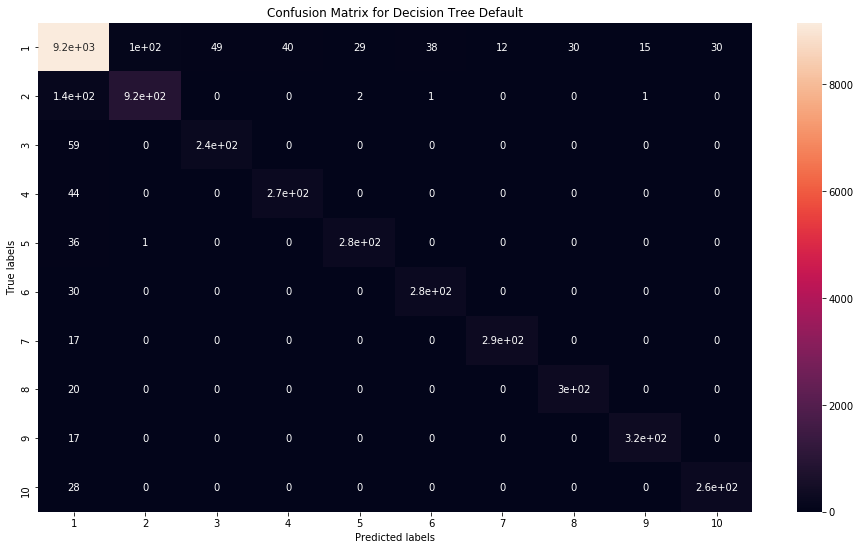


Decision Tree gini index  Accuracy Score:  0.7433363970588235

Plotting the confusion matrix to observe which data points are incorrectly classified



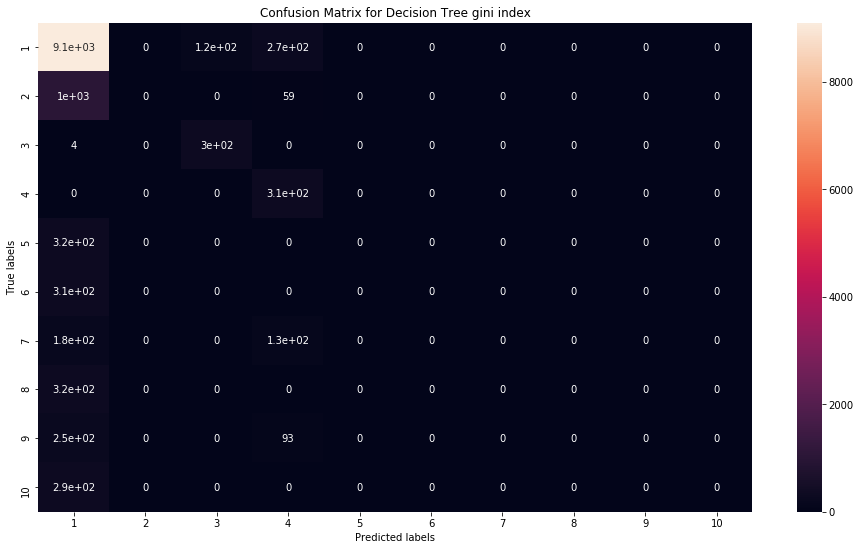


Random Forest  Accuracy Score:  0.9666053921568627

Plotting the confusion matrix to observe which data points are incorrectly classified



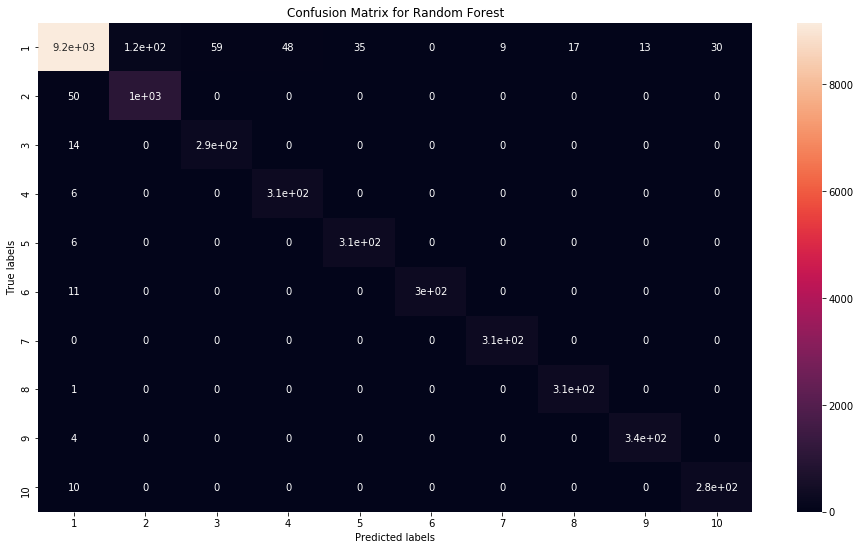


Decision Tree with information gain  Accuracy Score:  0.8330269607843137

Plotting the confusion matrix to observe which data points are incorrectly classified



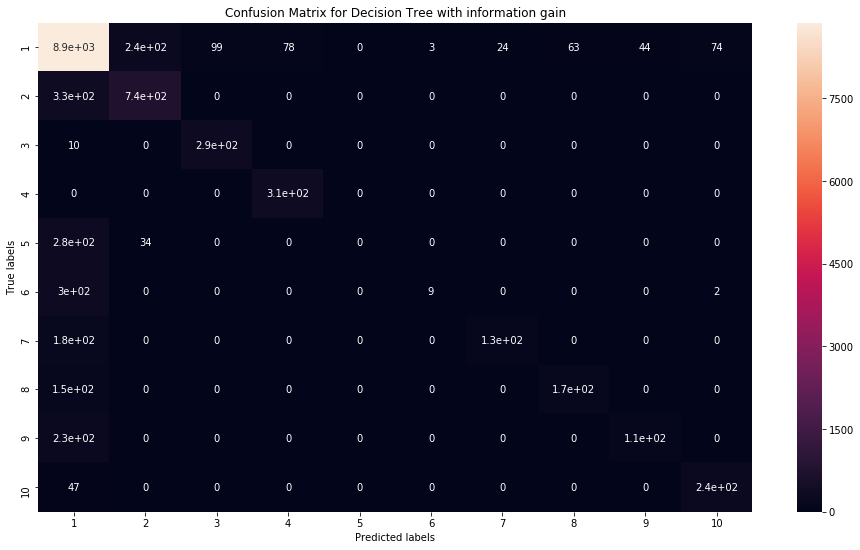

In [60]:
classifier_train_predict(X_train, y_train, X_test, y_test)

# SMOTE

### SMOTE is an oversampling method. It works by creating synthetic samples from the minor class instead of creating copies. 

In [61]:
df.head()

,1,2,3,4,5,6,7,8,9,10,...,15,16,17,18,19,20,21,22,23,Class
0,-9.8646,0.298600,1.6900,-0.25955,-0.146520,0.49965,-9.6680,1.5216,-0.47866,-0.53471,...,-4.6451,-8.2508,1.9208,-0.98039,-0.41889,0.18966,0.72891,1.07810,-0.357210,0
1,-9.7753,0.381060,1.6132,-0.12977,-0.058608,0.40572,-9.5801,1.4001,-0.48423,-0.54409,...,-4.7847,-8.2609,1.9099,-0.98039,-0.41889,0.18966,0.18670,0.71683,-0.725460,0
2,-9.6195,0.169430,1.7205,-0.10466,-0.037677,0.42741,-9.6488,1.4593,-0.48423,-0.54409,...,-4.4974,-8.3198,2.0215,-0.97647,-0.42094,0.20043,0.18855,0.90189,-0.366260,0
3,-9.7610,0.169380,1.5837,-0.11722,-0.037677,0.32193,-9.4522,1.3119,-0.48423,-0.54409,...,-4.6902,-8.4318,1.8180,-0.97647,-0.42094,0.20043,0.18677,0.72405,-0.003505,0
4,-9.8078,-0.013582,1.6514,-0.13815,-0.054422,0.46731,-9.6397,1.3769,-0.49165,-0.52345,...,-4.7595,-8.4420,1.7966,-0.97647,-0.42094,0.20043,0.74339,2.52610,-0.732410,0


In [62]:
df_smote = df

In [63]:
df_smote.iloc[0]

1       -9.864600
2        0.298600
3        1.690000
4       -0.259550
5       -0.146520
6        0.499650
7       -9.668000
8        1.521600
9       -0.478660
10      -0.534710
11       0.534380
12       0.008773
13       0.366880
14      -0.292440
15      -4.645100
16      -8.250800
17       1.920800
18      -0.980390
19      -0.418890
20       0.189660
21       0.728910
22       1.078100
23      -0.357210
Class    0.000000
Name: 0, dtype: float64

In [64]:
df_smote.Class.value_counts()

0    95029
1    10240
8     3430
7     3328
6     3174
9     3072
5     3072
4     3072
3     3072
2     3072
Name: Class, dtype: int64

In [65]:
df_smote.dtypes

1        float64
2        float64
3        float64
4        float64
5        float64
6        float64
7        float64
8        float64
9        float64
10       float64
11       float64
12       float64
13       float64
14       float64
15       float64
16       float64
17       float64
18       float64
19       float64
20       float64
21       float64
22       float64
23       float64
Class      int64
dtype: object

### Checking if there is any null value left in any column

In [66]:
df_smote.isnull().sum(axis = 0)

1        0
2        0
3        0
4        0
5        0
6        0
7        0
8        0
9        0
10       0
11       0
12       0
13       0
14       0
15       0
16       0
17       0
18       0
19       0
20       0
21       0
22       0
23       0
Class    0
dtype: int64

### Creating the Training and Test Sets

### With the prepared data, I can create a training dataset and a test dataset. I’ll use the training dataset to build and validate the model, and treat the test dataset as the unseen new data which I’d see smilar to when the model is in production.

In [67]:
training_features, test_features, \
training_target, test_target, = train_test_split(df_smote.drop(['Class'], axis=1),
                                               df_smote['Class'],
                                               test_size = .1,
                                               random_state=12)

In [68]:
test_features.shape

(13057, 23)

In [69]:
test_target.shape

(13057,)

In [70]:
training_features.head()

,1,2,3,4,5,6,7,8,9,10,...,14,15,16,17,18,19,20,21,22,23
56714,-0.57728,0.076292,9.97530,-0.108840,-0.071167,5.95030,0.39356,7.67290,0.064935,-0.686680,...,-0.14446,-2.2370,8.0854,5.53970,-0.61176,0.80287,-0.036638,0.3680,0.89292,-1.0846
33978,-10.56100,-1.245100,0.81426,-0.129770,-0.050235,6.12100,-12.76000,-3.72260,-0.306120,-0.900560,...,-8.94670,-12.8910,1.5485,-0.15174,-0.84314,0.17043,-0.543100,10.1200,6.56570,-22.9680
22427,-9.58200,0.816750,-0.34755,0.548400,0.313970,1.12950,-9.50040,2.43210,-0.536180,-0.281430,...,-2.40830,-3.6317,-5.6938,6.62160,-0.99608,-0.65503,0.435340,2.4876,15.37200,-2.9921
3166,-9.00630,-0.693410,2.75860,-0.075353,0.029304,0.87824,-9.81720,0.45542,-0.495360,-0.628520,...,-1.48050,-8.9257,1.8557,3.57200,-0.83725,0.69815,0.215520,-16.4800,-86.02700,92.2270
84219,-6.26310,-0.479250,-9.85370,-0.259550,-0.460490,0.13628,-6.36760,-8.04620,-0.378480,-0.037523,...,0.77918,-1.7439,-13.4070,3.26710,-0.50392,-0.80493,-0.219830,19.3950,18.53900,-32.2880


In [71]:
x_train, x_val, y_train, y_val = train_test_split(training_features, training_target,
                                                  test_size = .3,
                                                  random_state=12)

In [72]:
 !pip install imblearn

You should consider upgrading via the 'python -m pip install --upgrade pip' command.


In [73]:
from imblearn.over_sampling import SMOTE

In [74]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import recall_score
#from imblearn.over_sampling import SMOTE

In [76]:
sm = SMOTE(random_state=12, ratio = 1.0)
x_train_res, y_train_res = sm.fit_sample(x_train, y_train)

C:\Users\Viral\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function _ratio_float is deprecated; Use a float for 'ratio' is deprecated from version 0.2. The support will be removed in 0.4. Use a dict, str, or a callable instead.
  warnings.warn(msg, category=DeprecationWarning)


### By oversampling only on the training data, none of the information in the validation data is being used to create synthetic observations. So these results should be generalizable.

### Using Ensembling Classifier - Random Forest

In [77]:
clf_rf = DecisionTreeClassifier()
clf_rf.fit(x_train_res, y_train_res)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [78]:
print ('Validation Results')
print (clf_rf.score(x_val, y_val))
print (recall_score(y_val, clf_rf.predict(x_val), average='micro'))
print ('\nTest Results')
print (clf_rf.score(test_features, test_target))
print (recall_score(test_target, clf_rf.predict(test_features), average='micro'))

Validation Results
0.9366560762509929
0.9366560762509929

Test Results
0.9365091521789078
0.9365091521789078


In [79]:
predicted_sm = clf.predict(test_features)

In [80]:
target_names = ['class 1', 'Class 2', 'Class 3', 'Class 4', 'Class 5', 'Class 6', 'Class 7', 'Class 8', 'Class 9', 'class 10']
print(classification_report(test_target, predicted_sm, target_names=target_names))

             precision    recall  f1-score   support

    class 1       1.00      1.00      1.00      9414
    Class 2       0.99      0.99      0.99      1027
    Class 3       0.99      0.99      0.99       303
    Class 4       0.98      0.99      0.99       348
    Class 5       0.99      0.99      0.99       302
    Class 6       0.99      1.00      0.99       319
    Class 7       1.00      1.00      1.00       322
    Class 8       0.99      0.99      0.99       358
    Class 9       1.00      1.00      1.00       360
   class 10       0.99      1.00      1.00       304

avg / total       1.00      1.00      1.00     13057



Confusion Matrix
[[9382   11    4    6    2    4    0    2    1    2]
 [   9 1018    0    0    0    0    0    0    0    0]
 [   3    0  300    0    0    0    0    0    0    0]
 [   3    0    0  345    0    0    0    0    0    0]
 [   2    0    0    0  300    0    0    0    0    0]
 [   1    0    0    0    0  318    0    0    0    0]
 [   1    0    0    0    0    0  321    0    0    0]
 [   2    0    0    0    0    0    0  356    0    0]
 [   0    0    0    0    0    0    0    0  360    0]
 [   1    0    0    0    0    0    0    0    0  303]]

Plotting the confusion matrix to observe which data points are incorrectly classified



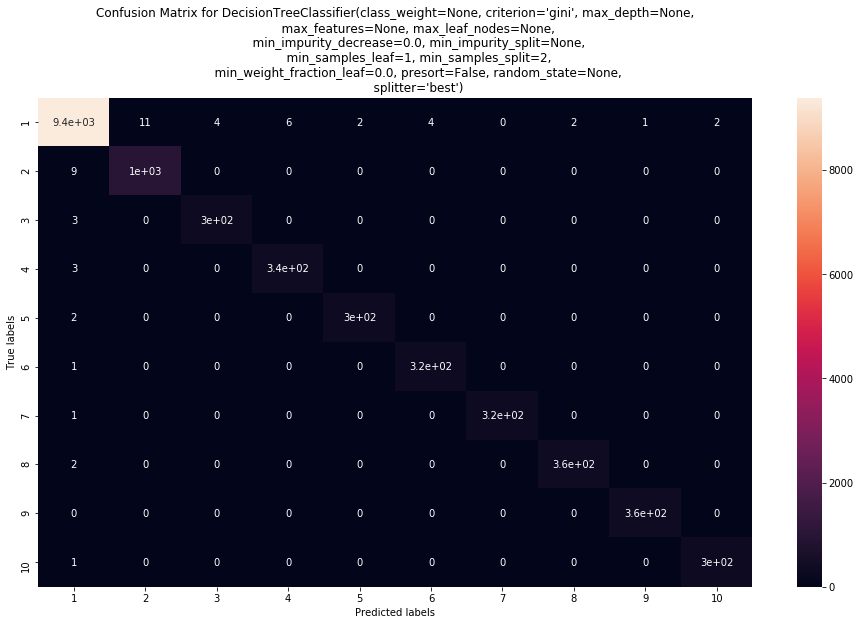

In [81]:
cnf_matrix = confusion_matrix(test_target, predicted_sm)
print("Confusion Matrix")
print(cnf_matrix)
print()
plotConfusionMatrix(cnf_matrix,clf)

In [82]:
print("Accuracy: ", accuracy_score(test_target, predicted_sm))

Accuracy:  0.9958642873554415


In [83]:
unique_elements, counts_elements = np.unique(test_target, return_counts=True)
print("Frequency of unique values of the said array:")
print(np.asarray((unique_elements, counts_elements)))

Frequency of unique values of the said array:
[[   0    1    2    3    4    5    6    7    8    9]
 [9414 1027  303  348  302  319  322  358  360  304]]


### As we can see that the validation results closely match the unseen test data results, which is exactly what we would want to see after putting a model into production.

### Oversampling is a well-known way to potentially improve models trained on imbalanced data. But it’s important to remember that oversampling incorrectly can lead to thinking a model will generalize better than it actually does. Random forests are great because the model architecture reduces overfitting, but poor sampling practices can still lead to false conclusions about the quality of a model. When the model is in production, it’s predicting on unseen data. The main point of model validation is to estimate how the model will generalize to new data. If the decision to put a model into production is based on how it performs on a validation set, it’s critical that oversampling is done correctly.